In [1]:
import json
from os.path import isfile

In [2]:
datafile = "/local/ecw/DeepScribe_Data_2023-02-04-selected/imagesWithHotspots.json"
imgbase = "/local/ecw/DeepScribe_Data_2023-02-04-selected/images"

In [3]:
with open(datafile) as inf:
    all_data = json.load(inf)

In [4]:
#check to see if all image files are present!! 
for dat in all_data:
    if not isfile(imgbase + "/" + dat["file_name"]):
        print(dat["file_name"] +  " missing!")

In [6]:
example_data = all_data[1]

In [7]:
example_data

{'text_id': '90013f0f-2a26-4a57-93ce-d56c5d206411',
 'image_name': 'Fort. 1329-102 Bottom Edge 1, conventional, annotated',
 'file_name': '13722a66-213f-09a3-bf8e-101a4347314d.jpg',
 'is_published': 'false',
 'width': 3379,
 'annotations': [{'category_id': 1,
   'sign_id': 'bd11534d-ea92-1ce7-2965-54416f582b02',
   'bbox': [407, 385, 899, 675],
   'sign': 'RA',
   'reading': 'ra',
   'epigraphicUnit_id': 'f4aee563-78af-4fb0-bd95-47b8776c7b31',
   'reading_id': '1a439b5f-3a02-76d8-9fba-6d86d489846d'},
  {'category_id': 2,
   'sign_id': '8e667637-f077-5dc2-3f5a-b75edde6ebd3',
   'bbox': [1010, 323, 1204, 686],
   'sign': 'NÍG',
   'reading': 'šá',
   'epigraphicUnit_id': 'b4df0498-eb5e-4885-bc8a-ad4564a3db2f',
   'reading_id': '6e406575-f11e-a537-3095-937f21be463c'},
  {'category_id': 1,
   'sign_id': 'bd11534d-ea92-1ce7-2965-54416f582b02',
   'bbox': [1432, 419, 1890, 709],
   'sign': 'RA',
   'reading': 'ra',
   'epigraphicUnit_id': '2afa39b4-add0-467c-9320-73a52303f4ee',
   'reading_i

In [21]:
from torchvision.utils import draw_bounding_boxes
from torchvision.io import read_image
import torch
import torchvision.transforms.functional as F
from PIL import Image

In [13]:
base_image = read_image(imgbase + "/" + example_data["file_name"])

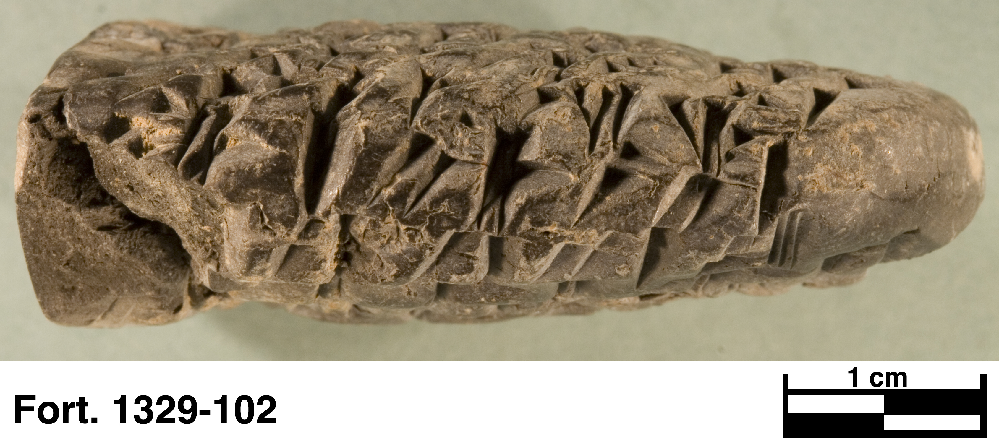

In [17]:
F.to_pil_image(base_image)

In [25]:
boxes = torch.tensor([anno["bbox"] for anno in example_data["annotations"]], dtype=torch.float)

In [32]:
result = draw_bounding_boxes(base_image, boxes, width=10)

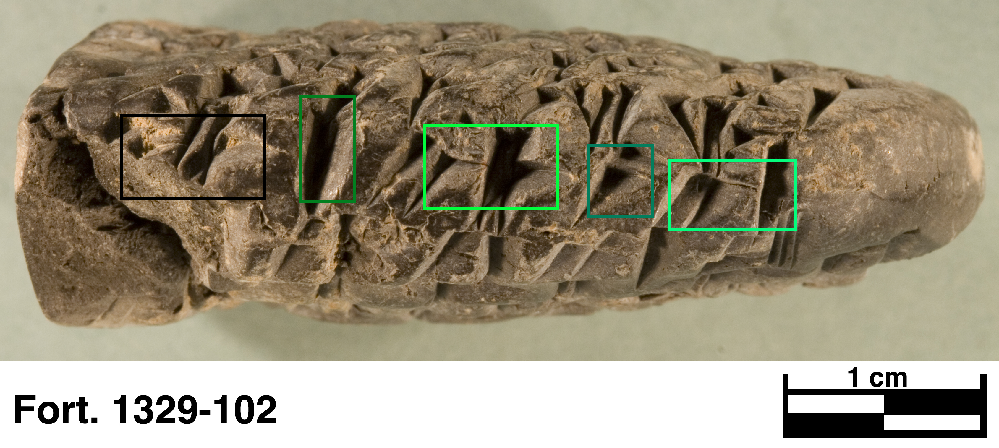

In [33]:
F.to_pil_image(result)

In [34]:
# autocropping image.
from deepscribe2.preprocessing.crop_images import crop_image

ModuleNotFoundError: No module named 'deepscribe2'